# JPEG Artifact Removal
In this notebook, we train and evaluate our proposed GAN restorer for JPEG artifact removal.



## Acknowledgements
This notebook is based on Google's TensorFlow 2 tutorial for implementing Pix2Pix.

Read the original tutorial here: https://www.tensorflow.org/tutorials/generative/pix2pix

Read the original Pix2Pix paper here: https://arxiv.org/abs/1611.07004

Our model is based on Zhao et al.'s model from the paper: https://jivp-eurasipjournals.springeropen.com/articles/10.1186/s13640-019-0465-0

We make the model smaller and modify the network to accept RGB images. We also employ a NoGAN training approach and introduce our novel loss function.

## Prepare dataset

Import required libraries

In [1]:
import tensorflow as tf
import numpy as np
import cv2
import random
import os
import pathlib
import time
import datetime
from matplotlib import pyplot as plt
from IPython import display
from sklearn.model_selection import train_test_split
from google.colab import drive

# Mount Google Drive and set default path
drive.mount('/content/drive')

# IMPORTANT: Change this to your own path, ending with "dataset/"
PATH = "/content/drive/MyDrive/dataset/"

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


Set random seed

In [2]:
seed = 42
tf.random.set_seed(seed)
np.random.seed(seed)
random.seed(seed)

Functions to get and preprocess dataset

In [3]:
BLOCK_SIZE = 256
OUTPUT_CHANNELS = 3


def normalize(images):
    '''Normalize image values from [0,255] to [-1,1]'''
    images = (images / 127.5) - 1
    return images


def denormalize(images):
    '''Denormalize image values from [-1,1] to [0,255]'''
    images = (images + 1) * 127.5
    return images


def get_data_split(path):
    '''Get training, validation, and testing data from dataset. Images 
    compressed with different quality factors are stored in different npy files.
    This function enables all image variations derived from a specific image in 
    the dataset to always be in training, validation, or testing, regardless of 
    its compression type.'''

    # Load the compressed images
    Z = np.empty((1, BLOCK_SIZE, BLOCK_SIZE, OUTPUT_CHANNELS), dtype="float32")
    X = np.concatenate((
        Z,
        np.load(PATH + f"restorer_npy/{path}")
    ))[1:]

    # Load the uncompressed images (ground truth)
    if BLOCK_SIZE == 256:
        Y = np.load(PATH + f"restorer_npy/njpeglite.npy")
    else:
        Y = np.load(PATH + f"restorer_npy/njpegsmalllite.npy")
    Y = np.concatenate((Z, Y, Y, Y))[1:]

    # Normalize images
    for i in range(0, len(X), 1000):
        X[i:i+1000] = normalize(X[i:i+1000])
        Y[i:i+1000] = normalize(Y[i:i+1000])

    # Create training, validation, and testing split
    BUFFER_SIZE = len(X)

    X_train, X_test, Y_train, Y_test = train_test_split(
        X[:BUFFER_SIZE], Y[:BUFFER_SIZE], test_size=1/10, random_state=42)

    X_train, X_val, Y_train, Y_val = train_test_split(
        X_train[:BUFFER_SIZE], Y_train[:BUFFER_SIZE], test_size=1/9,
        random_state=42)

    del X, Y

    return X_train, X_val, X_test, Y_train, Y_val, Y_test

Get dataset as a TensorFlow dataset. We use a 256x256 partition for each of the 1000 images.

In [4]:
EFFECTIVE_QF = 30

X_train1, X_val1, X_test1, Y_train1, Y_val1, Y_test1 = get_data_split(
    f"sjpeg{EFFECTIVE_QF}lite.npy")
X_train2, X_val2, X_test2, Y_train2, Y_val2, Y_test2 = get_data_split(
    f"djpeg50{EFFECTIVE_QF}lite.npy")

X_train = np.concatenate((X_train1, X_train2))
Y_train = np.concatenate((Y_train1, Y_train2))
del X_train1, X_train2, Y_train1, Y_train2

X_val = np.concatenate((X_val1, X_val2))
Y_val = np.concatenate((Y_val1, Y_val2))
del X_val1, X_val2, Y_val1, Y_val2

X_test = np.concatenate((X_test1, X_test2))
Y_test = np.concatenate((Y_test1, Y_test2))
del X_test1, X_test2, Y_test1, Y_test2

Get dataset as TensorFlow Dataset. We use a batch size of 1, as recommended by Pix2Pix for image generation tasks.

In [5]:
BUFFER_SIZE = len(X_train)
BATCH_SIZE = 1

train_dataset = tf.data.Dataset.from_tensor_slices((X_train, Y_train))
train_dataset = train_dataset.shuffle(BUFFER_SIZE)
train_dataset = train_dataset.batch(BATCH_SIZE)

## Prepare generator and discriminator

Define loss functions

In [6]:
# Weighting for scaling losses to (roughly) same magnitude and weigh importance
ALPHA = 1000  # MAE
BETA = 300    # MS-SSIM
GAMMA = 1     # VGG

cross_entropy = tf.keras.losses.BinaryCrossentropy()
mae = tf.keras.losses.MeanAbsoluteError()
# mse = tf.keras.losses.MeanSquaredError() # Zhao

# VGG model
vgg = tf.keras.applications.VGG19(weights='imagenet', include_top=False, input_shape=(
    BLOCK_SIZE, BLOCK_SIZE, OUTPUT_CHANNELS))
vgg.trainable = False
lossModel = tf.keras.models.Model(
    inputs=[vgg.input],
    outputs=[vgg.get_layer('block5_conv4').output],
    name='vggL'
)


@tf.function()
def VGG_loss(X, Y):
    '''Gets loss based on VGG-19 activations'''

    # Preprocess inputs for VGG-19
    Xt = tf.keras.applications.vgg19.preprocess_input(denormalize(X))
    Yt = tf.keras.applications.vgg19.preprocess_input(denormalize(Y))

    # Get VGG-19 activations of the generated image and ground truth image
    vggX = lossModel(Xt)
    vggY = lossModel(Yt)

    # Get the differences of the activations
    # (for loop not necessary since we are only using one layer of VGG-19. This
    #  is here for experimentation purposes when we want to specify more VGG-19
    #   layers to use for loss.)
    loss_list = []
    total = 0
    for i in range(len(vggX)):
        total += tf.reduce_mean(tf.square(vggX[i] - vggY[i]))
        loss_list.append(total)
    return total, loss_list


def generator_loss(disc_generated_output, gen_output, target, use_disc=True):
    '''Returns the generator's loss based on on the discriminator outputs,
    generator outputs, and the ground truth images'''

    #  If training simultaneously with discriminator
    if use_disc:
        gan_loss = cross_entropy(
            tf.ones_like(disc_generated_output), disc_generated_output)
    else:
        gan_loss = 0

    # Pixel-based loss
    l1_loss = mae(target, gen_output)
    # l2_loss = mse(target, gen_output) # Zhao

    # Perception-based losses
    ms_ssim_loss = 1 - tf.reduce_mean(
        tf.image.ssim_multiscale(target + 1, gen_output + 1, 2))

    vgg_loss, vgg_loss_list = VGG_loss(target, gen_output)

    total_gen_loss = gan_loss + ALPHA*l1_loss + BETA*ms_ssim_loss + GAMMA*vgg_loss

    return total_gen_loss, gan_loss, l1_loss, ms_ssim_loss, vgg_loss, vgg_loss_list


def discriminator_loss(disc_real_output, disc_generated_output):
    '''Returns the discriminator's loss based on its outputs for the generated
    images and outputs for the ground truth images.'''

    real_loss = cross_entropy(tf.ones_like(disc_real_output), disc_real_output)
    generated_loss = cross_entropy(
        tf.zeros_like(disc_generated_output), disc_generated_output)

    return real_loss + generated_loss

Downsampling and upsampling layers. Downsampling is used for both the discriminator and generator, whereas upsampling is only for the generator

In [7]:
def downsample(filters, size, apply_batchnorm=True, apply_dropout=False, leaky=False):
    '''Constructs and returns a downsampling layer'''

    initializer = tf.random_normal_initializer(0., 0.02)

    result = tf.keras.Sequential()
    result.add(
        tf.keras.layers.Conv2D(filters, size, strides=2, padding='same',
                               kernel_initializer=initializer, use_bias=False))

    # Configuration
    if apply_batchnorm:
        result.add(tf.keras.layers.BatchNormalization())

    if apply_dropout:
        result.add(tf.keras.layers.Dropout(0.001))

    # Activation
    if leaky:
        result.add(tf.keras.layers.LeakyReLU())
    else:
        result.add(tf.keras.layers.ReLU())

    return result


def upsample(filters, size, apply_batchnorm=True, apply_dropout=False, leaky=False):
    '''Constructs and returns an upsampling layer'''

    initializer = tf.random_normal_initializer(0., 0.02)

    result = tf.keras.Sequential()
    result.add(
        tf.keras.layers.Conv2DTranspose(filters, size, strides=2,
                                        padding='same',
                                        kernel_initializer=initializer,
                                        use_bias=False))

    # Configuration
    if apply_batchnorm:
        result.add(tf.keras.layers.BatchNormalization())

    if apply_dropout:
        result.add(tf.keras.layers.Dropout(0.001))

    # Activation
    if leaky:
        result.add(tf.keras.layers.LeakyReLU())
    else:
        result.add(tf.keras.layers.ReLU())

    return result

Create the generator network

In [8]:
def Generator():
    '''Create and return the generator network (U-net structure)'''

    # Accept any sized RGB image
    # Do not explicitly specify random noise - randomness is achieved using dropout
    inputs = tf.keras.layers.Input(shape=[None, None, 3])

    # Decoder definition (downsampling layers)
    down_stack = [
        downsample(64, 3, apply_batchnorm=False, leaky=True),   # Zhao: 3x3, Batchnorm=False
        downsample(128, 4, leaky=True),                        
        downsample(256, 4, leaky=False),                        # Zhao: leaky=True
        # downsample(512, 4, leaky=False),                      # Zhao: leaky=False
    ]

    # Encoder definition (upsampling layers)
    up_stack = [
        # upsample(256, 4),                                     
        upsample(128, 4, apply_dropout=True), # Dropout used since without somehow only gives 0 output 
        upsample(64, 4),  
    ]

    initializer = tf.random_normal_initializer(0., 0.02)
    last = tf.keras.layers.Conv2DTranspose(OUTPUT_CHANNELS, 4, strides=2, 
                                            padding='same',
                                            kernel_initializer=initializer,
                                            activation='tanh')  

    x = inputs

    # Construct decoder
    skips = []
    for down in down_stack:
        x = down(x)
        skips.append(x)

    skips = reversed(skips[:-1])

    # Construct encoder and establish skip connections
    for up, skip in zip(up_stack, skips):
        x = up(x)
        x = tf.keras.layers.Concatenate()([x, skip])

    x = last(x)

    return tf.keras.Model(inputs=inputs, outputs=x)

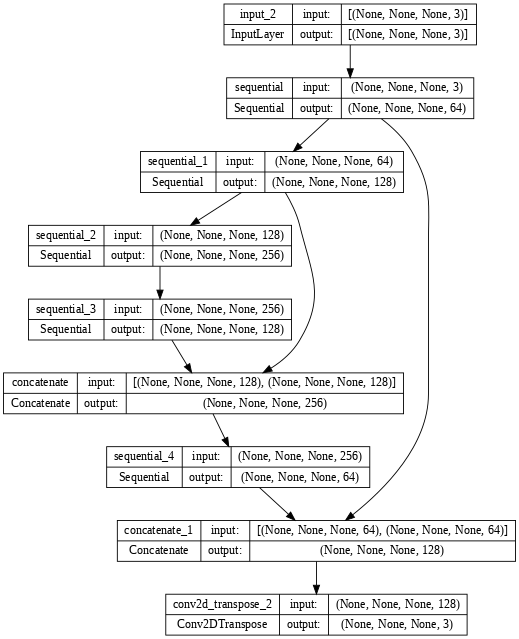

In [9]:
generator = Generator()
tf.keras.utils.plot_model(generator, show_shapes=True, dpi=64)

Create the discriminator network

In [10]:
def Discriminator():
    '''Create and return the discriminator network (70x70 PatchGAN)'''

    initializer = tf.random_normal_initializer(0., 0.02)

    # Takes as input both the image to classify and the ground truth image
    inp = tf.keras.layers.Input(shape=[None, None, 3], name='input_image')
    tar = tf.keras.layers.Input(shape=[None, None, 3], name='target_image')

    assert inp.shape == tar.shape

    x = tf.keras.layers.concatenate([inp, tar]) 

    # Downsampling layers
    down1 = downsample(64, 4, leaky=True, apply_batchnorm=False)(x)     # Zhao: batchnorm = True, Pix2Pix: batchnorm = False
    down2 = downsample(128, 4, leaky=True)(down1)  
    down3 = downsample(256, 4, leaky=True)(down2)  

    zero_pad1 = tf.keras.layers.ZeroPadding2D()(down3)  
    conv = tf.keras.layers.Conv2D(512, 4, strides=1,
                                  kernel_initializer=initializer,
                                  use_bias=False)(zero_pad1) 

    batchnorm1 = tf.keras.layers.BatchNormalization()(conv)

    leaky_relu = tf.keras.layers.LeakyReLU()(batchnorm1)

    zero_pad2 = tf.keras.layers.ZeroPadding2D()(leaky_relu)  

    last = tf.keras.layers.Conv2D(1, 4, strides=1,
                                  kernel_initializer=initializer, 
                                  activation='sigmoid')(zero_pad2) 

    return tf.keras.Model(inputs=[inp, tar], outputs=last)

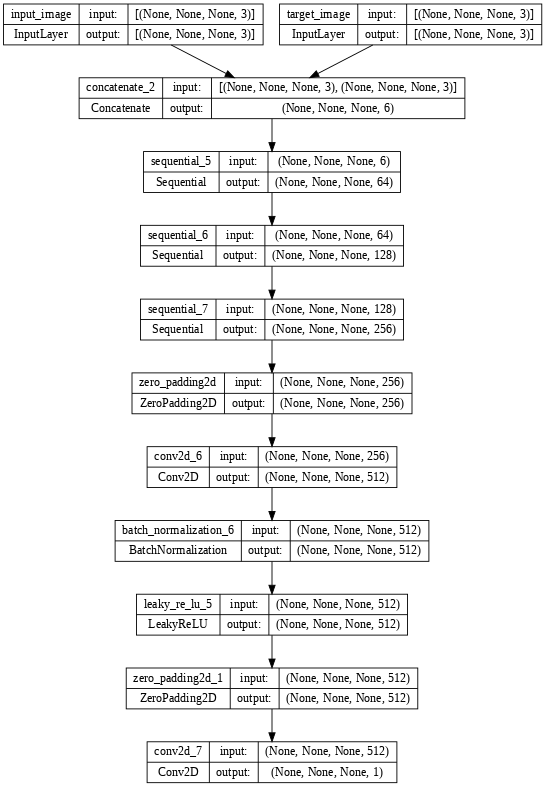

In [11]:
discriminator = Discriminator()
tf.keras.utils.plot_model(discriminator, show_shapes=True, dpi=64)

Training functions. The best model is saved, based on validation data.

In [12]:
# Training optimizer
generator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
discriminator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

# Initialize checkpoint
checkpoint_dir = './training_checkpoints'
checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
                                 discriminator_optimizer=discriminator_optimizer,
                                 generator=generator,
                                 discriminator=discriminator)

# Create file writer for TensorBoard
log_dir = "logs/"
summary_writer = tf.summary.create_file_writer(
    log_dir + "fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))


def generate_images(model, test_input, tar):
    '''Given an input image, shows and returns the generator's output'''

    prediction = model(test_input, training=True)

    # Plot the prediction
    plt.figure(figsize=(15, 15))

    display_list = [test_input[0], tar[0], prediction[0]]
    title = ['Input Image', 'Ground Truth', 'Predicted Image']

    for i in range(3):
        plt.subplot(1, 3, i+1)
        plt.title(title[i])
        # Getting the pixel values in the [0, 1] range to plot.
        plt.imshow(display_list[i] * 0.5 + 0.5)
        plt.axis('off')
    plt.show()

    return prediction[0]


@tf.function
def train_step(input_image, target, step, use_disc=True):
    '''Given a image(s) and target(s), do one training step for both the
    discriminator and generator. Write losses to summary writer.'''

    # Train the generator and discriminator
    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:

        # Set random seeds
        tf.random.set_seed(seed)
        np.random.seed(seed)
        random.seed(seed)

        # Generate output image
        gen_output = generator(input_image, training=True)

        # Get discriminator outputs for the real image and generated image
        disc_real_output = discriminator([input_image, target], training=True)
        disc_generated_output = discriminator(
            [input_image, gen_output], training=True)

        # Get generator loss (and each component of its loss for logging)
        (
            gen_total_loss,
            gen_gan_loss,
            gen_l1_loss,
            gen_ms_ssim_loss,
            gen_vgg_loss,
            gen_vgg_loss_list
        ) = generator_loss(disc_generated_output, gen_output, target, use_disc)

        # Get discriminator loss
        disc_loss = discriminator_loss(disc_real_output, disc_generated_output)

        # Get gradients of the generator and discriminator
        generator_gradients = gen_tape.gradient(
            gen_total_loss, generator.trainable_variables)
        discriminator_gradients = disc_tape.gradient(
            disc_loss, discriminator.trainable_variables)

        # Update the weights of the generator and discriminator
        generator_optimizer.apply_gradients(
            zip(generator_gradients, generator.trainable_variables))
        discriminator_optimizer.apply_gradients(
            zip(discriminator_gradients, discriminator.trainable_variables))

    # Loss logging
    with summary_writer.as_default():
        tf.summary.scalar('disc_loss', disc_loss, step=step//1000)

        tf.summary.scalar('gen_total_loss', gen_total_loss, step=step//1000)
        tf.summary.scalar('gen_gan_loss', gen_gan_loss, step=step//1000)
        tf.summary.scalar('gen_l1_loss', gen_l1_loss, step=step//1000)
        tf.summary.scalar('gen_ms_ssim_loss',
                          gen_ms_ssim_loss, step=step//1000)
        tf.summary.scalar('gen_vgg_loss', gen_vgg_loss, step=step//1000)

        for i, loss in enumerate(gen_vgg_loss_list):
            tf.summary.scalar(f'gen_vgg_loss_layer_{i}', loss, step=step//1000)


def fit(steps, use_disc=True):
    '''Given a training dataset, perform specified number of training steps'''

    example_input, example_target = X_test[0][np.newaxis, ...], Y_test[0][np.newaxis, ...]
    start = time.time()
    best_psnr = 0
    best_step = 0

    # Training loop
    for step, (input_image, target) in train_dataset.repeat().take(steps).enumerate():

        # Every 1000 steps
        if step == 0 or (step + 1) % 1000 == 0:
            display.clear_output(wait=True)

            generate_images(generator, example_input, example_target)

            # Checkpoint at best model, based on validation data
            if step != 0:
                psnr = evaluate_model(generator, X_val, Y_val)
                if psnr > best_psnr:
                    best_psnr = psnr
                    best_step = step
                    checkpoint.save(file_prefix=checkpoint_prefix)

                print(
                    f'Time taken for 1000 steps: {time.time()-start:.2f} sec\n')
                print(f"Step: {(step+1)//1000}k")
                print(f"PSNR: {psnr}dB")
                print(
                    f"Best PSNR: {best_psnr}dB (Step: {(best_step+1)//1000}k)")

                start = time.time()

        # Every 10 steps
        if (step + 1) % 10 == 0:
            print('.', end='', flush=True)

        # Perform step
        train_step(input_image, target, step, use_disc)

Evaluation functions

In [13]:
def evaluate_model(model, X, Y):
    '''Return the PSNR of the generated images based on X compared to real 
    images Y'''

    predictions = model(X, training=True)
    return compare_images(Y, predictions)


def compare_images(img1, img2):
    '''Return the PSNR of img1 and img2'''

    psnr = tf.reduce_mean(tf.image.psnr(img1 + 1, img2 + 1, 2))
    return psnr.numpy()

## Train the GAN

In [14]:
%load_ext tensorboard
%tensorboard --logdir {log_dir}

<IPython.core.display.Javascript object>

preGAN

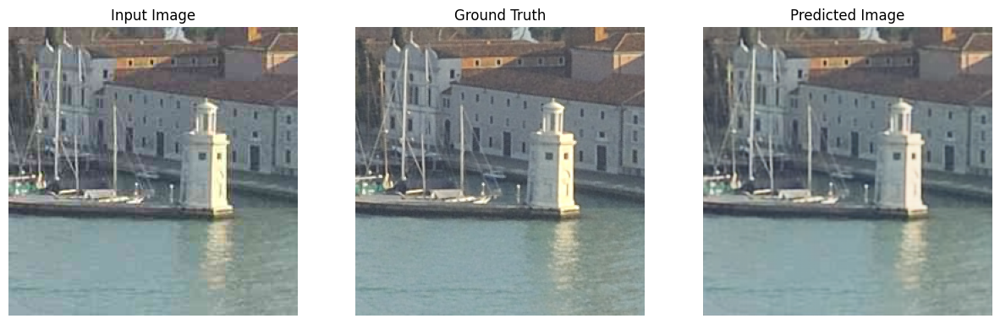

Time taken for 1000 steps: 77.83 sec

Step: 50k
PSNR: 32.15677261352539dB
Best PSNR: 32.751155853271484dB (Step: 47k)
.

In [15]:
# Train the discriminator and generator separately
fit(steps=50000, use_disc=False)

In [16]:
# Save preGAN
# !ls {checkpoint_dir}
# checkpoint.restore(tf.train.latest_checkpoint(checkpoint_dir))

generator.save("gen_pregan")

In [17]:
# Evaluate preGAN
evaluate_model(generator, X_test, Y_test)

32.042942

postGAN

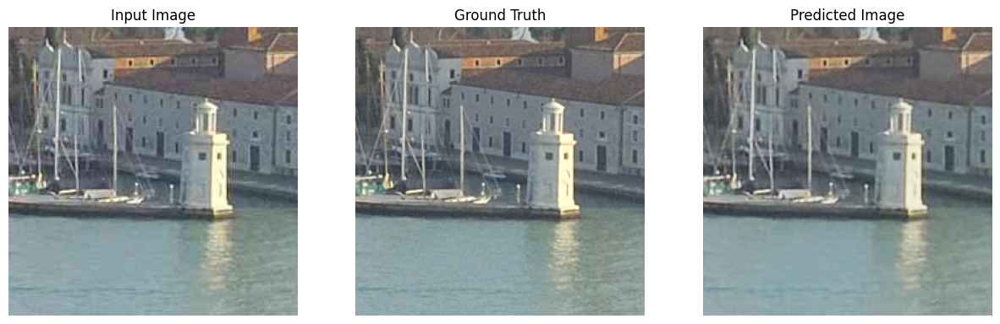

Time taken for 1000 steps: 81.35 sec

Step: 50k
PSNR: 32.54875564575195dB
Best PSNR: 32.900062561035156dB (Step: 49k)
.

In [18]:
# Train the discriminator and generator simultaneously
fit(steps=50000, use_disc=True)

In [19]:
# Save postGAN
!ls {checkpoint_dir}
checkpoint.restore(tf.train.latest_checkpoint(checkpoint_dir))

generator.save("gen_postgan")

checkpoint		     ckpt-19.index
ckpt-10.data-00000-of-00001  ckpt-1.data-00000-of-00001
ckpt-10.index		     ckpt-1.index
ckpt-11.data-00000-of-00001  ckpt-2.data-00000-of-00001
ckpt-11.index		     ckpt-2.index
ckpt-12.data-00000-of-00001  ckpt-3.data-00000-of-00001
ckpt-12.index		     ckpt-3.index
ckpt-13.data-00000-of-00001  ckpt-4.data-00000-of-00001
ckpt-13.index		     ckpt-4.index
ckpt-14.data-00000-of-00001  ckpt-5.data-00000-of-00001
ckpt-14.index		     ckpt-5.index
ckpt-15.data-00000-of-00001  ckpt-6.data-00000-of-00001
ckpt-15.index		     ckpt-6.index
ckpt-16.data-00000-of-00001  ckpt-7.data-00000-of-00001
ckpt-16.index		     ckpt-7.index
ckpt-17.data-00000-of-00001  ckpt-8.data-00000-of-00001
ckpt-17.index		     ckpt-8.index
ckpt-18.data-00000-of-00001  ckpt-9.data-00000-of-00001
ckpt-18.index		     ckpt-9.index
ckpt-19.data-00000-of-00001


In [20]:
# Evaluate postGAN
evaluate_model(generator, X_test, Y_test)

33.21566